In [1]:
from keras.datasets import mnist
(X_train, y_train), (X_test, y_test) = mnist.load_data()

In [2]:
import matplotlib.pyplot as plt

In [3]:
X_train=X_train.reshape(60000,784)
X_test=X_test.reshape(10000,784)

In [4]:
X_test.shape

(10000, 784)

In [5]:
X_train.shape

(60000, 784)

In [6]:
from sklearn.neighbors import KNeighborsClassifier
knn = KNeighborsClassifier()

knn.fit(X_train,y_train)

KNeighborsClassifier()

In [7]:
import time
start = time.time()

y_pred = knn.predict(X_test)
print(time.time() - start)

26.95053219795227


In [8]:
from sklearn.metrics import accuracy_score
accuracy_score(y_test,y_pred)

from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()

In [9]:
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

In [10]:
# PCA 
from sklearn.decomposition import PCA
pca = PCA(n_components=100) #only take 100 most important component out of 784 component

X_train_trf = pca.fit_transform(X_train)
X_test_trf = pca.transform(X_test)

In [11]:
X_train_trf.shape
knn = KNeighborsClassifier()

knn.fit(X_train_trf,y_train)
y_pred = knn.predict(X_test_trf)
accuracy_score(y_test,y_pred)

0.9574

In [12]:
for i in range(100,110): #check for 1 to 784
    pca = PCA(n_components=i)
    X_train_trf = pca.fit_transform(X_train)
    X_test_trf = pca.transform(X_test)
    
    knn = KNeighborsClassifier()
    
    knn.fit(X_train_trf,y_train)
    
    y_pred = knn.predict(X_test_trf)
    
    print(accuracy_score(y_test,y_pred))

0.9571
0.9575
0.9578
0.958
0.9571
0.9565
0.9572
0.9574
0.9577
0.9575


In [13]:
# transforming to a 2D coordinate system
pca = PCA(n_components=2)
X_train_trf = pca.fit_transform(X_train)
X_test_trf = pca.transform(X_test)
X_train_trf

array([[-0.92214875, -4.81488289],
       [ 8.70895321, -7.75463444],
       [ 2.32832603,  9.43153202],
       ...,
       [-3.77719512, -3.23071875],
       [ 1.72237346, -4.94844498],
       [-1.42727264, -6.17558569]])

In [14]:
import plotly.express as px
y_train_trf = y_train.astype(str)
fig = px.scatter(x=X_train_trf[:,0],
                 y=X_train_trf[:,1],
                 color=y_train_trf,
                 color_discrete_sequence=px.colors.qualitative.G10
                )
fig.show()

In [45]:
# transforming in 3D
pca = PCA(n_components=3)
X_train_trf = pca.fit_transform(X_train)
X_test_trf = pca.transform(X_test)
X_train_trf

array([[-9.22146772e-01, -4.81431471e+00,  6.85727072e-02],
       [ 8.70897233e+00, -7.75459611e+00, -3.44845329e+00],
       [ 2.32842191e+00,  9.43144701e+00, -6.18673524e+00],
       ...,
       [-3.77721049e+00, -3.23032446e+00, -3.80573546e+00],
       [ 1.72237139e+00, -4.94801887e+00,  8.48725804e-03],
       [-1.42724477e+00, -6.17509852e+00, -2.96792961e+00]])

In [46]:
### here need whole data frame as df see line 3
import plotly.express as px
y_train_trf = y_train.astype(str)
fig = px.scatter_3d(x=X_train_trf[:,0], y=X_train_trf[:,1], z=X_train_trf[:,2],
              color=y_train_trf)
fig.update_layout(
    margin=dict(l=20, r=20, t=20, b=20),
    paper_bgcolor="LightSteelBlue",
)
fig.show()

In [47]:
pca.explained_variance_
# Eigen values

array([40.48763511, 29.24169745, 26.81180397])

In [49]:
pca.explained_variance_ratio_ #how many fraction that variance explain the data

array([0.05646717, 0.04078272, 0.0373938 ])

In [48]:
# pca.components_.shape
pca.components_            #3 vector of dimention 784
# Eigen vectors

array([[ 1.21861006e-19,  6.37261422e-21, -2.17067251e-19, ...,
        -0.00000000e+00, -0.00000000e+00, -0.00000000e+00],
       [ 5.53675158e-17, -3.84599494e-18,  8.00584485e-18, ...,
        -0.00000000e+00, -0.00000000e+00, -0.00000000e+00],
       [-2.61182261e-16, -1.38292412e-17,  2.47981187e-17, ...,
        -0.00000000e+00, -0.00000000e+00, -0.00000000e+00]])

In [50]:
pca = PCA(n_components=None)
X_train_trf = pca.fit_transform(X_train)
X_test_trf = pca.transform(X_test)

In [51]:
pca.explained_variance_

array([4.04876351e+01, 2.92416975e+01, 2.68118045e+01, 2.06866182e+01,
       1.80766501e+01, 1.57331779e+01, 1.37906091e+01, 1.25175891e+01,
       1.10067953e+01, 1.00504971e+01, 9.62045779e+00, 8.63097356e+00,
       7.99159687e+00, 7.81488215e+00, 7.37553786e+00, 7.13058751e+00,
       6.71398002e+00, 6.60400749e+00, 6.40604846e+00, 6.23737743e+00,
       5.93229172e+00, 5.76059855e+00, 5.48403364e+00, 5.31859721e+00,
       5.12873534e+00, 4.96062446e+00, 4.90533662e+00, 4.70843497e+00,
       4.52919760e+00, 4.39470849e+00, 4.27522172e+00, 4.21399693e+00,
       4.09838079e+00, 4.03181137e+00, 3.97713624e+00, 3.86052409e+00,
       3.80864021e+00, 3.72563426e+00, 3.64393543e+00, 3.44169730e+00,
       3.41624517e+00, 3.36378527e+00, 3.25773631e+00, 3.23620323e+00,
       3.20478100e+00, 3.17911021e+00, 3.14205728e+00, 3.08588859e+00,
       3.06076556e+00, 3.03759974e+00, 2.90171955e+00, 2.86408562e+00,
       2.84980787e+00, 2.82374220e+00, 2.76632955e+00, 2.71778127e+00,
      

In [52]:
pca.explained_variance_.shape
# Eigen values

(784,)

In [53]:
pca.components_ 
# Eigen vectors

array([[-3.85011588e-20, -1.04083409e-17,  5.55111512e-17, ...,
        -0.00000000e+00, -0.00000000e+00, -0.00000000e+00],
       [-2.78333381e-19, -2.77555756e-17,  0.00000000e+00, ...,
         0.00000000e+00,  0.00000000e+00,  0.00000000e+00],
       [ 4.25944523e-21, -1.30104261e-17,  2.34187669e-17, ...,
         0.00000000e+00,  0.00000000e+00,  0.00000000e+00],
       ...,
       [ 0.00000000e+00,  9.38298461e-02,  2.74653240e-01, ...,
         0.00000000e+00,  0.00000000e+00,  0.00000000e+00],
       [-0.00000000e+00,  3.53308844e-01,  8.94641379e-02, ...,
        -0.00000000e+00, -0.00000000e+00, -0.00000000e+00],
       [ 0.00000000e+00,  2.62280389e-01,  5.80176283e-02, ...,
         0.00000000e+00,  0.00000000e+00,  0.00000000e+00]])

In [54]:
pca.components_.shape

(784, 784)

In [55]:
pca.explained_variance_ratio_

array([5.64671692e-02, 4.07827199e-02, 3.73938042e-02, 2.88511485e-02,
       2.52110863e-02, 2.19426996e-02, 1.92334439e-02, 1.74579923e-02,
       1.53509230e-02, 1.40171960e-02, 1.34174302e-02, 1.20374194e-02,
       1.11456955e-02, 1.08992356e-02, 1.02864922e-02, 9.94486564e-03,
       9.36383280e-03, 9.21045666e-03, 8.93436778e-03, 8.69912619e-03,
       8.27363019e-03, 8.03417369e-03, 7.64845500e-03, 7.41772464e-03,
       7.15292868e-03, 6.91846831e-03, 6.84135964e-03, 6.56674546e-03,
       6.31676724e-03, 6.12919839e-03, 5.96255295e-03, 5.87716416e-03,
       5.71591699e-03, 5.62307416e-03, 5.54682002e-03, 5.38418374e-03,
       5.31182250e-03, 5.19605602e-03, 5.08211255e-03, 4.80005571e-03,
       4.76455820e-03, 4.69139360e-03, 4.54348956e-03, 4.51345787e-03,
       4.46963401e-03, 4.43383155e-03, 4.38215469e-03, 4.30381751e-03,
       4.26877901e-03, 4.23647017e-03, 4.04696121e-03, 3.99447403e-03,
       3.97456119e-03, 3.93820800e-03, 3.85813590e-03, 3.79042674e-03,
      

In [57]:
import numpy as np
np.cumsum(pca.explained_variance_ratio_) #cumulative sum

array([0.05646717, 0.09724989, 0.13464369, 0.16349484, 0.18870593,
       0.21064863, 0.22988207, 0.24734006, 0.26269099, 0.27670818,
       0.29012561, 0.30216303, 0.31330873, 0.32420796, 0.33449446,
       0.34443932, 0.35380315, 0.36301361, 0.37194798, 0.3806471 ,
       0.38892074, 0.39695491, 0.40460336, 0.41202109, 0.41917402,
       0.42609249, 0.43293384, 0.43950059, 0.44581736, 0.45194656,
       0.45790911, 0.46378627, 0.46950219, 0.47512526, 0.48067208,
       0.48605627, 0.49136809, 0.49656415, 0.50164626, 0.50644631,
       0.51121087, 0.51590227, 0.52044576, 0.52495921, 0.52942885,
       0.53386268, 0.53824483, 0.54254865, 0.54681743, 0.5510539 ,
       0.55510086, 0.55909534, 0.5630699 , 0.56700811, 0.57086624,
       0.57465667, 0.57841069, 0.58211845, 0.5857679 , 0.5893609 ,
       0.59288472, 0.59636266, 0.59980677, 0.60320546, 0.606565  ,
       0.60991386, 0.6132325 , 0.61646276, 0.61962553, 0.62275797,
       0.62586528, 0.62893771, 0.63198685, 0.63501403, 0.63800

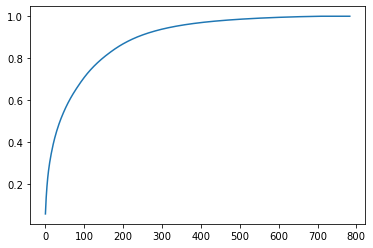

In [58]:
plt.plot(np.cumsum(pca.explained_variance_ratio_))